# Phase 2 - Week 1 - Day 3 AM - Computer Vision - Image Preprocessing

# Data and Library Preparation

In [1]:
import tensorflow as tf
from pathlib import Path
!pip install -q jmd_imagescraper
from jmd_imagescraper.core import *
import glob
import numpy as np
import matplotlib.pyplot as plt
import os

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 18.0 MB/s eta 0:00:00


In [2]:
root = Path().cwd()/"images"

duckduckgo_search(root, "Cats", "cute kittens", max_results=8)
duckduckgo_search(root, "Dogs", "cute puppies", max_results=8)

Duckduckgo search: cute kittens


Duckduckgo search: cute puppies


[PosixPath('/content/images/Dogs/001_5911148b.jpg'),
 PosixPath('/content/images/Dogs/002_aba1c0c4.jpg'),
 PosixPath('/content/images/Dogs/003_6b1c0bfe.jpg'),
 PosixPath('/content/images/Dogs/004_ebdff4a3.jpg'),
 PosixPath('/content/images/Dogs/005_9b85db5f.jpg'),
 PosixPath('/content/images/Dogs/006_86fb8df7.jpg'),
 PosixPath('/content/images/Dogs/007_dcc818d6.jpg'),
 PosixPath('/content/images/Dogs/008_4028081c.jpg')]

In [3]:
cats_files = glob.glob('/content/images/Cats/*')
dogs_files = glob.glob('/content/images/Dogs/*')

for cf in cats_files:
  num = cf.split('/')[-1].split('_')[0]
  os.rename(cf,f'/content/images/Cats/cat_{num}.jpg')
for df in dogs_files:
  num = df.split('/')[-1].split('_')[0]
  os.rename(df,f'/content/images/Dogs/dog_{num}.jpg')

In [4]:
cats_files = glob.glob('/content/images/Cats/*')
dogs_files = glob.glob('/content/images/Dogs/*')

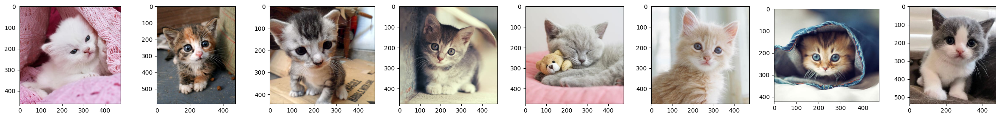

In [5]:
fig,ax = plt.subplots(ncols=len(cats_files),figsize=(30,3))
for i in range(len(cats_files)):
  cat = plt.imread(cats_files[i])
  ax[i].imshow(cat)

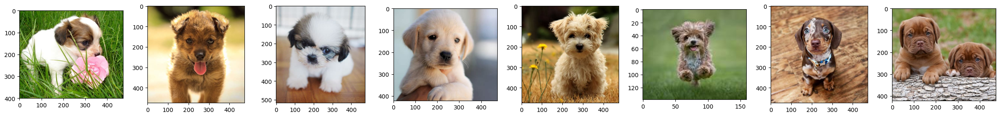

In [6]:
fig,ax = plt.subplots(ncols=len(dogs_files),figsize=(30,3))
for i in range(len(dogs_files)):
  dog = plt.imread(dogs_files[i])
  ax[i].imshow(dog)

# Loading Image Data in Tensorflow

<img src="https://miro.medium.com/v2/resize:fit:1400/format:webp/1*_Qs5j9GbBrL-eGflY2AKFQ.png"></img>

Sumber: [tds](https://towardsdatascience.com/what-is-the-best-input-pipeline-to-train-image-classification-models-with-tf-keras-eb3fe26d3cc5)

## Image Data Generator from directory

In [7]:
IMG_SIZE = 400
path = '/content/images/'

datagen = tf.keras.preprocessing.image.ImageDataGenerator()
data = datagen.flow_from_directory(path, (IMG_SIZE, IMG_SIZE), batch_size=32, class_mode='binary', shuffle=False) #class_mode = categorical for multiclass

Found 16 images belonging to 2 classes.


In [8]:
data

In [9]:
data.next()

(array([[[[255., 255., 255.],
          [253., 253., 255.],
          [250., 250., 252.],
          ...,
          [224., 228., 214.],
          [229., 233., 218.],
          [229., 233., 218.]],
 
         [[254., 254., 255.],
          [252., 252., 254.],
          [248., 248., 250.],
          ...,
          [221., 225., 211.],
          [226., 230., 215.],
          [226., 230., 215.]],
 
         [[252., 252., 254.],
          [249., 249., 251.],
          [246., 246., 248.],
          ...,
          [217., 221., 207.],
          [223., 227., 212.],
          [223., 227., 212.]],
 
         ...,
 
         [[140., 113.,  86.],
          [143., 116.,  89.],
          [147., 120.,  93.],
          ...,
          [202., 199., 182.],
          [208., 206., 191.],
          [208., 206., 191.]],
 
         [[152., 127.,  97.],
          [155., 130., 100.],
          [151., 124.,  95.],
          ...,
          [206., 203., 188.],
          [214., 212., 199.],
          [207., 205., 192.

In [10]:
data.next()[0].shape

(16, 400, 400, 3)

In [11]:
data.next()[0][0]

array([[[255., 255., 255.],
        [253., 253., 255.],
        [250., 250., 252.],
        ...,
        [224., 228., 214.],
        [229., 233., 218.],
        [229., 233., 218.]],

       [[254., 254., 255.],
        [252., 252., 254.],
        [248., 248., 250.],
        ...,
        [221., 225., 211.],
        [226., 230., 215.],
        [226., 230., 215.]],

       [[252., 252., 254.],
        [249., 249., 251.],
        [246., 246., 248.],
        ...,
        [217., 221., 207.],
        [223., 227., 212.],
        [223., 227., 212.]],

       ...,

       [[140., 113.,  86.],
        [143., 116.,  89.],
        [147., 120.,  93.],
        ...,
        [202., 199., 182.],
        [208., 206., 191.],
        [208., 206., 191.]],

       [[152., 127.,  97.],
        [155., 130., 100.],
        [151., 124.,  95.],
        ...,
        [206., 203., 188.],
        [214., 212., 199.],
        [207., 205., 192.]],

       [[152., 127.,  97.],
        [155., 130., 100.],
        [151., 1

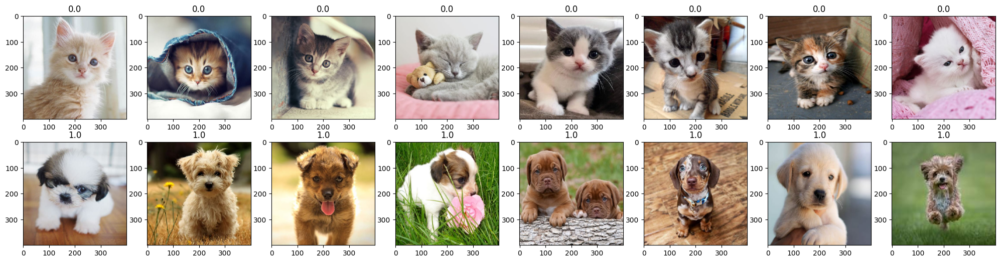

In [12]:
fig,ax = plt.subplots(nrows=2,ncols=8,figsize=(25,6))
n=0
for i in range(2):
  for j in range(8):
    img = data.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(data.next()[1][n])
    n+=1

In [13]:
data.class_indices

{'Cats': 0, 'Dogs': 1}

In [14]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(validation_split=0.2)
train = imgen.flow_from_directory(path,
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)
val = imgen.flow_from_directory(path,
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='validation',shuffle=False)

Found 14 images belonging to 2 classes.
Found 2 images belonging to 2 classes.


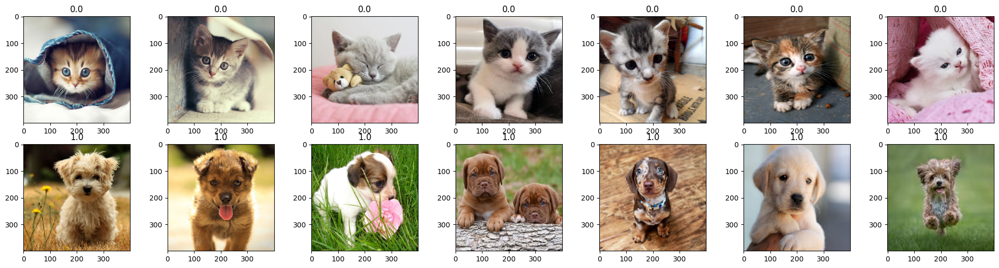

In [15]:
fig,ax = plt.subplots(nrows=2,ncols=7,figsize=(25,6))
n=0
for i in range(2):
  for j in range(7):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

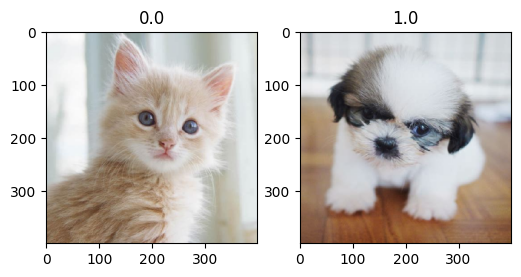

In [16]:
fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(6,6))
n=0
for i in range(2):
  img = val.next()[0][n].astype('uint8')
  ax[i].imshow(img)
  ax[i].set_title(val.next()[1][n])
  n+=1

### flow from dataframe

In [17]:
import pandas as pd

imgs = cats_files+dogs_files
labels = ['cats' for i in range(len(cats_files))]+['dogs' for i in range(len(dogs_files))]
data = pd.DataFrame({'images':imgs,'label':labels})
data = data.sample(len(data)).reset_index(drop=True)
data

,images,label
0,/content/images/Dogs/dog_001.jpg,dogs
1,/content/images/Dogs/dog_004.jpg,dogs
2,/content/images/Cats/cat_006.jpg,cats
3,/content/images/Dogs/dog_006.jpg,dogs
4,/content/images/Cats/cat_004.jpg,cats
5,/content/images/Dogs/dog_005.jpg,dogs
6,/content/images/Cats/cat_008.jpg,cats
7,/content/images/Cats/cat_007.jpg,cats
8,/content/images/Cats/cat_005.jpg,cats
9,/content/images/Cats/cat_002.jpg,cats


In [18]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(validation_split=0.25) #validation_split is 0.25 only to make the division even
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)
val = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='validation',shuffle=False)

Found 12 validated image filenames belonging to 2 classes.
Found 4 validated image filenames belonging to 2 classes.


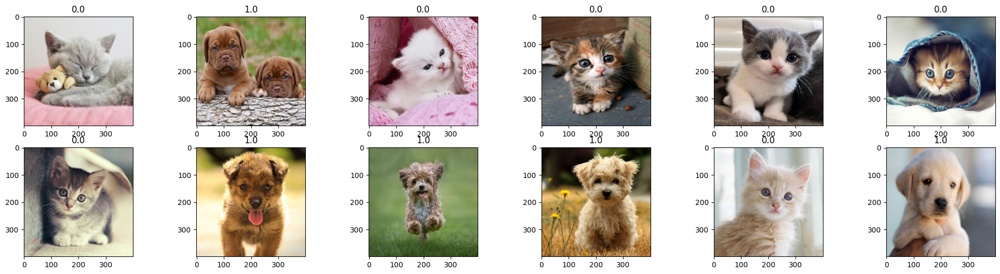

In [19]:
fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

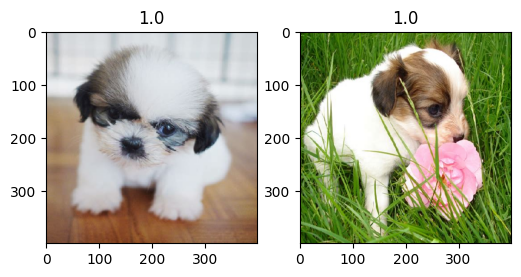

In [20]:
fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(6,6))
n=0
for i in range(2):
  img = val.next()[0][n].astype('uint8')
  ax[i].imshow(img)
  ax[i].set_title(val.next()[1][n])
  n+=1

## Data Augmentatation

### Horizontal Flip

Found 12 validated image filenames belonging to 2 classes.


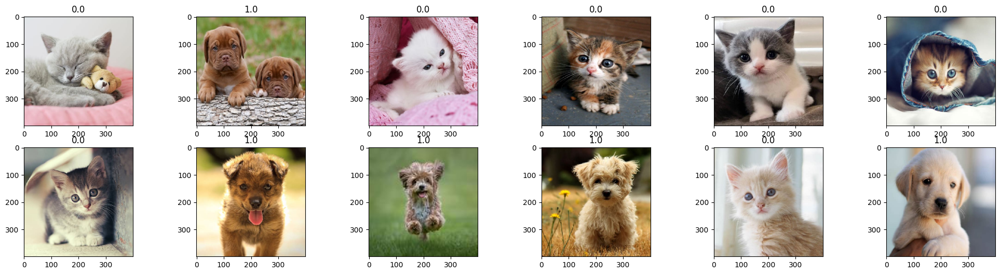

In [21]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(horizontal_flip=True,
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Vertical Flip

Found 12 validated image filenames belonging to 2 classes.


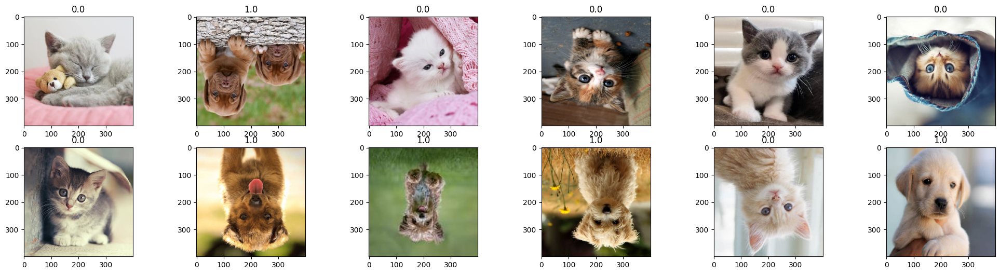

In [22]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(vertical_flip=True,
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Width Shift

Found 12 validated image filenames belonging to 2 classes.


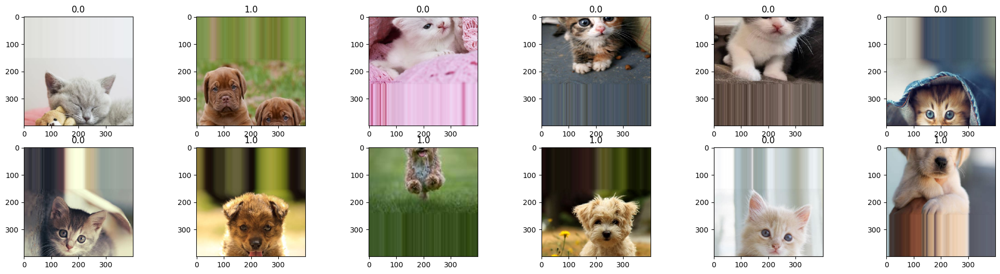

In [23]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(width_shift_range=[-150, 150],
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Height Shift

Found 12 validated image filenames belonging to 2 classes.


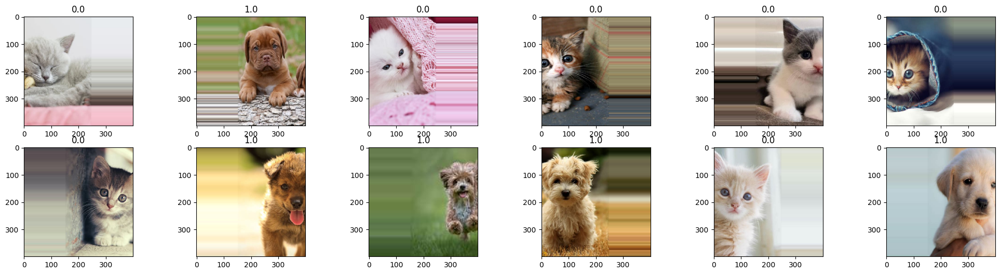

In [24]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(height_shift_range=[-150, 150],
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Rotation

Found 12 validated image filenames belonging to 2 classes.


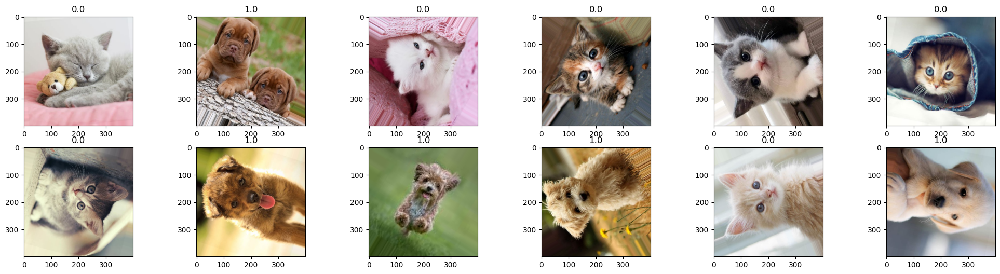

In [25]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=120,
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Zoom

Found 12 validated image filenames belonging to 2 classes.


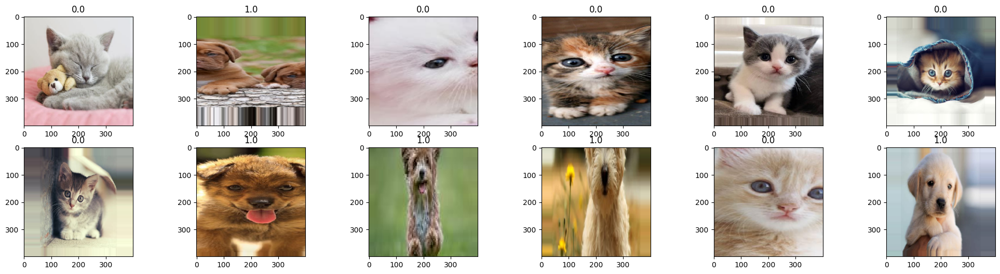

In [26]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(zoom_range=[0.3, 1.5],
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Shear

Found 12 validated image filenames belonging to 2 classes.


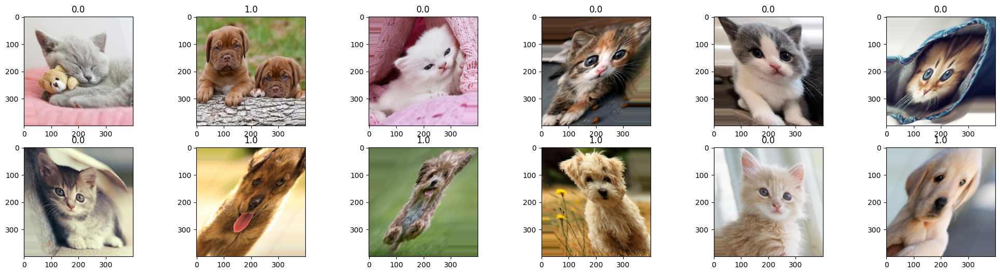

In [27]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(shear_range=50,
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1

### Combining All Together

Found 12 validated image filenames belonging to 2 classes.


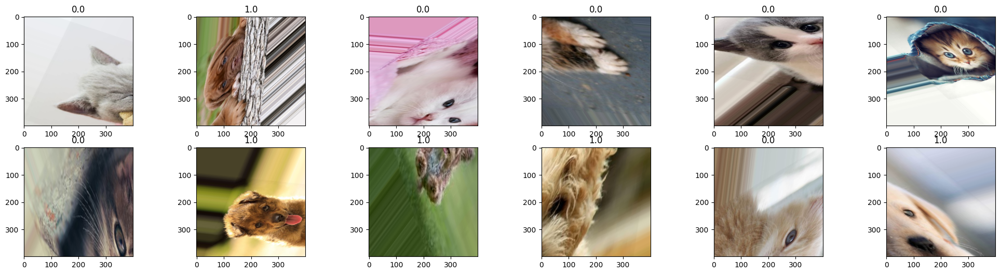

In [28]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(width_shift_range=[-100, 100],
                                                        height_shift_range=[-100, 100],
                                                        rotation_range=120,
                                                        zoom_range = [0.3, 1.5] ,
                                                        shear_range=50,
                                                        validation_split=0.25)
train = imgen.flow_from_dataframe(data,
                                  x_col='images',
                                  y_col='label',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='training',shuffle=False)

fig,ax = plt.subplots(nrows=2,ncols=6,figsize=(25,6))
n=0
for i in range(2):
  for j in range(6):
    img = train.next()[0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title(train.next()[1][n])
    n+=1